In [40]:
from collections import OrderedDict
from typing import Tuple, Union

import numpy as np
import torch
import torch.nn.functional as F
from torch import nn

from PIL import Image


class LayerNorm(nn.LayerNorm):
    """Subclass torch's LayerNorm to handle fp16."""

    def forward(self, x: torch.Tensor):
        orig_type = x.dtype
        ret = super().forward(x.type(torch.float32))
        return ret.type(orig_type)


class QuickGELU(nn.Module):
    def forward(self, x: torch.Tensor):
        return x * torch.sigmoid(1.702 * x)


class ResidualAttentionBlock(nn.Module):
    def __init__(self, d_model: int, n_head: int, attn_mask: torch.Tensor = None):
        super().__init__()

        self.attn = nn.MultiheadAttention(d_model, n_head)
        self.ln_1 = LayerNorm(d_model)
        self.mlp = nn.Sequential(OrderedDict([
            ("c_fc", nn.Linear(d_model, d_model * 4)),
            ("gelu", QuickGELU()),
            ("c_proj", nn.Linear(d_model * 4, d_model))
        ]))
        self.ln_2 = LayerNorm(d_model)
        self.attn_mask = attn_mask

    def attention(self, x: torch.Tensor):
        self.attn_mask = self.attn_mask.to(dtype=x.dtype, device=x.device) if self.attn_mask is not None else None
        return self.attn(x, x, x, need_weights=False, attn_mask=self.attn_mask)[0]

    def forward(self, x: torch.Tensor):
        x = x + self.attention(self.ln_1(x))
        x = x + self.mlp(self.ln_2(x))
        return x


class Transformer(nn.Module):
    def __init__(self, width: int, layers: int, heads: int, attn_mask: torch.Tensor = None):
        super().__init__()
        self.width = width
        self.layers = layers
        self.resblocks = nn.Sequential(*[ResidualAttentionBlock(width, heads, attn_mask) for _ in range(layers)])

    def forward(self, x: torch.Tensor):
        return self.resblocks(x)


class VisionTransformer(nn.Module):
    def __init__(self, input_resolution: int, patch_size: int, width: int, layers: int, heads: int, output_dim: int):
        super().__init__()
        self.input_resolution = input_resolution
        self.output_dim = output_dim
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=width, kernel_size=patch_size, stride=patch_size, bias=False)

        scale = width ** -0.5
        self.class_embedding = nn.Parameter(scale * torch.randn(width))
        self.positional_embedding = nn.Parameter(scale * torch.randn((input_resolution // patch_size) ** 2 + 1, width))
        self.ln_pre = LayerNorm(width)

        self.transformer = Transformer(width, layers, heads)

        self.ln_post = LayerNorm(width)
        self.proj = nn.Parameter(scale * torch.randn(width, output_dim))

    def forward(self, x: torch.Tensor):
        x = self.conv1(x)  # shape = [*, width, grid, grid]
        x = x.reshape(x.shape[0], x.shape[1], -1)  # shape = [*, width, grid ** 2]
        x = x.permute(0, 2, 1)  # shape = [*, grid ** 2, width]
        x = torch.cat([self.class_embedding.to(x.dtype) + torch.zeros(x.shape[0], 1, x.shape[-1], dtype=x.dtype, device=x.device), x], dim=1)  # shape = [*, grid ** 2 + 1, width]
        x = x + self.positional_embedding.to(x.dtype)
        x = self.ln_pre(x)

        x = x.permute(1, 0, 2)  # NLD -> LND
        x = self.transformer(x)
        x = x.permute(1, 0, 2)  # LND -> NLD

        x = self.ln_post(x[:, 0, :])

        if self.proj is not None:
            x = x @ self.proj

        return x


class CLIP(nn.Module):
    def __init__(self,
                 embed_dim: int,
                 # vision
                 image_resolution: int,
                 vision_layers: Union[Tuple[int, int, int, int], int],
                 vision_width: int,
                 vision_patch_size: int,
                 # text
                 context_length: int,
                 vocab_size: int,
                 transformer_width: int,
                 transformer_heads: int,
                 transformer_layers: int
                 ):
        super().__init__()

        self.context_length = context_length

        vision_heads = vision_width // 64
        self.visual = VisionTransformer(
            input_resolution=image_resolution,
            patch_size=vision_patch_size,
            width=vision_width,
            layers=vision_layers,
            heads=vision_heads,
            output_dim=embed_dim
        )

        self.transformer = Transformer(
            width=transformer_width,
            layers=transformer_layers,
            heads=transformer_heads,
            attn_mask=self.build_attention_mask()
        )

        self.vocab_size = vocab_size
        self.token_embedding = nn.Embedding(vocab_size, transformer_width)
        self.positional_embedding = nn.Parameter(torch.empty(self.context_length, transformer_width))
        self.ln_final = LayerNorm(transformer_width)

        self.text_projection = nn.Parameter(torch.empty(transformer_width, embed_dim))
        self.logit_scale = nn.Parameter(torch.ones([]) * np.log(1 / 0.07))

        self.initialize_parameters()

    def initialize_parameters(self):
        nn.init.normal_(self.token_embedding.weight, std=0.02)
        nn.init.normal_(self.positional_embedding, std=0.01)

        proj_std = (self.transformer.width ** -0.5) * ((2 * self.transformer.layers) ** -0.5)
        attn_std = self.transformer.width ** -0.5
        fc_std = (2 * self.transformer.width) ** -0.5
        for block in self.transformer.resblocks:
            nn.init.normal_(block.attn.in_proj_weight, std=attn_std)
            nn.init.normal_(block.attn.out_proj.weight, std=proj_std)
            nn.init.normal_(block.mlp.c_fc.weight, std=fc_std)
            nn.init.normal_(block.mlp.c_proj.weight, std=proj_std)

        if self.text_projection is not None:
            nn.init.normal_(self.text_projection, std=self.transformer.width ** -0.5)

    def build_attention_mask(self):
        # lazily create causal attention mask, with full attention between the vision tokens
        # pytorch uses additive attention mask; fill with -inf
        mask = torch.empty(self.context_length, self.context_length)
        mask.fill_(float("-inf"))
        mask.triu_(1)  # zero out the lower diagonal
        return mask

    @property
    def dtype(self):
        return self.visual.conv1.weight.dtype

    def encode_image(self, image):
        return self.visual(image.type(self.dtype))

    def encode_text(self, text):
        x = self.token_embedding(text).type(self.dtype)  # [batch_size, n_ctx, d_model]

        x = x + self.positional_embedding.type(self.dtype)
        x = x.permute(1, 0, 2)  # NLD -> LND
        x = self.transformer(x)
        x = x.permute(1, 0, 2)  # LND -> NLD
        x = self.ln_final(x).type(self.dtype)

        # x.shape = [batch_size, n_ctx, transformer.width]
        # take features from the eot embedding (eot_token is the highest number in each sequence)
        x = x[torch.arange(x.shape[0]), text.argmax(dim=-1)] @ self.text_projection

        return x

    def forward(self, image, text):
        image_features = self.encode_image(image)
        text_features = self.encode_text(text)

        # normalized features
        image_features = image_features / image_features.norm(dim=-1, keepdim=True)
        text_features = text_features / text_features.norm(dim=-1, keepdim=True)

        # cosine similarity as logits
        logit_scale = self.logit_scale.exp()
        logits_per_image = logit_scale * image_features @ text_features.t()
        logits_per_text = logits_per_image.t()

        # shape = [global_batch_size, global_batch_size]
        return logits_per_image, logits_per_text


def convert_weights(model: nn.Module):
    """Convert applicable model parameters to fp16"""

    def _convert_weights_to_fp16(l):
        if isinstance(l, (nn.Conv1d, nn.Conv2d, nn.Linear)):
            l.weight.data = l.weight.data.half()
            if l.bias is not None:
                l.bias.data = l.bias.data.half()

        if isinstance(l, nn.MultiheadAttention):
            for attr in [*[f"{s}_proj_weight" for s in ["in", "q", "k", "v"]], "in_proj_bias", "bias_k", "bias_v"]:
                tensor = getattr(l, attr)
                if tensor is not None:
                    tensor.data = tensor.data.half()

        for name in ["text_projection", "proj"]:
            if hasattr(l, name):
                attr = getattr(l, name)
                if attr is not None:
                    attr.data = attr.data.half()

    model.apply(_convert_weights_to_fp16)

In [41]:
config_vit16 = {
    'vision_width': 768,
    'vision_layers': 12,
    'vision_patch_size': 16,
    'grid_size': 14,
    'image_resolution': 224,
    'embed_dim': 512,
    'context_length': 77,
    'vocab_size': 49408,
    'transformer_width': 512,
    'transformer_heads': 8,
    'transformer_layers': 12
}

config_vit32 = {
    'vision_width': 768,
    'vision_layers': 12,
    'vision_patch_size': 32,
    'grid_size': 7,
    'image_resolution': 224,
    'embed_dim': 512,
    'context_length': 77,
    'vocab_size': 49408,
    'transformer_width': 512,
    'transformer_heads': 8,
    'transformer_layers': 12
}

In [42]:
def build_model(config):
    model = CLIP(
        embed_dim=config["embed_dim"],
        image_resolution=config["image_resolution"], 
        vision_layers=config["vision_layers"], 
        vision_width=config["vision_width"], 
        vision_patch_size=config["vision_patch_size"],
        context_length=config["context_length"],
        vocab_size=config["vocab_size"],
        transformer_width=config["transformer_width"],
        transformer_heads=config["transformer_heads"],
        transformer_layers=config["transformer_layers"]
    )
    return model

**Can we load fp16 state dict into fp32 model?**
* Experiment on fp32 model (fp32 model parameters loaded from fp16 checkpoint)
    * load the fp16 parameters into a fp32 model
    * run an inference experiment on single example
    * run the cifar experiments on fp32 model
* Experiment on fp16 model (fp16 model parameters loaded from fp16 checkpoint)
    * load the fp16 parameters into a fp16 model
    * run an inference experiment on single example
    * run the cifar expeirments on fp16 model

In [43]:
import pickle 

state_dict_vit16 = pickle.load(open('models/ViT-B-16.pkl', 'rb'))
state_dict_vit32 = pickle.load(open('models/ViT-B-32.pkl', 'rb'))

In [44]:
def load_two_models():
    model_fp32 = build_model(config_vit32)
    model_fp16 = build_model(config_vit32)
    convert_weights(model_fp16)
    
    for key in ["input_resolution", "context_length", "vocab_size"]:
        if key in state_dict_vit32:
            print(key, state_dict_vit32[key])
            del state_dict_vit32[key]

    model_fp32.load_state_dict(state_dict_vit32)
    model_fp16.load_state_dict(state_dict_vit32)
    model_fp16.to('cuda:0')
    model_fp32.to('cuda:1')
    
    return model_fp16.eval(), model_fp32.eval()

In [45]:
model_fp16, model_fp32 = load_two_models()

input_resolution tensor(224)
context_length tensor(77)
vocab_size tensor(49408)


In [46]:
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize
from clip.clip import BICUBIC

def _convert_image_to_rgb(image):
    return image.convert("RGB")


def _transform(n_px):
    return Compose([
        Resize(n_px, interpolation=BICUBIC),
        CenterCrop(n_px),
        _convert_image_to_rgb,
        ToTensor(),
        Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)),
    ])

preprocess = _transform(config_vit32["image_resolution"])

In [47]:
import gzip
import html
import os
from functools import lru_cache
from typing import Any, Union, List

import ftfy
import regex as re


@lru_cache()
def bytes_to_unicode():
    """
    Returns list of utf-8 byte and a corresponding list of unicode strings.
    The reversible bpe codes work on unicode strings.
    This means you need a large # of unicode characters in your vocab if you want to avoid UNKs.
    When you're at something like a 10B token dataset you end up needing around 5K for decent coverage.
    This is a signficant percentage of your normal, say, 32K bpe vocab.
    To avoid that, we want lookup tables between utf-8 bytes and unicode strings.
    And avoids mapping to whitespace/control characters the bpe code barfs on.
    """
    bs = list(range(ord("!"), ord("~")+1))+list(range(ord("¡"), ord("¬")+1))+list(range(ord("®"), ord("ÿ")+1))
    cs = bs[:]
    n = 0
    for b in range(2**8):
        if b not in bs:
            bs.append(b)
            cs.append(2**8+n)
            n += 1
    cs = [chr(n) for n in cs]
    return dict(zip(bs, cs))


def get_pairs(word):
    """Return set of symbol pairs in a word.
    Word is represented as tuple of symbols (symbols being variable-length strings).
    """
    pairs = set()
    prev_char = word[0]
    for char in word[1:]:
        pairs.add((prev_char, char))
        prev_char = char
    return pairs


def basic_clean(text):
    text = ftfy.fix_text(text)
    text = html.unescape(html.unescape(text))
    return text.strip()


def whitespace_clean(text):
    text = re.sub(r'\s+', ' ', text)
    text = text.strip()
    return text


class SimpleTokenizer(object):
    def __init__(self, bpe_path: str = "clip/bpe_simple_vocab_16e6.txt.gz"):
        self.byte_encoder = bytes_to_unicode()
        self.byte_decoder = {v: k for k, v in self.byte_encoder.items()}
        merges = gzip.open(bpe_path).read().decode("utf-8").split('\n')
        merges = merges[1:49152-256-2+1]
        merges = [tuple(merge.split()) for merge in merges]
        vocab = list(bytes_to_unicode().values())
        vocab = vocab + [v+'</w>' for v in vocab]
        for merge in merges:
            vocab.append(''.join(merge))
        vocab.extend(['<|startoftext|>', '<|endoftext|>'])
        self.encoder = dict(zip(vocab, range(len(vocab))))
        self.decoder = {v: k for k, v in self.encoder.items()}
        self.bpe_ranks = dict(zip(merges, range(len(merges))))
        self.cache = {'<|startoftext|>': '<|startoftext|>', '<|endoftext|>': '<|endoftext|>'}
        self.pat = re.compile(r"""<\|startoftext\|>|<\|endoftext\|>|'s|'t|'re|'ve|'m|'ll|'d|[\p{L}]+|[\p{N}]|[^\s\p{L}\p{N}]+""", re.IGNORECASE)

    def bpe(self, token):
        if token in self.cache:
            return self.cache[token]
        word = tuple(token[:-1]) + ( token[-1] + '</w>',)
        pairs = get_pairs(word)

        if not pairs:
            return token+'</w>'

        while True:
            bigram = min(pairs, key = lambda pair: self.bpe_ranks.get(pair, float('inf')))
            if bigram not in self.bpe_ranks:
                break
            first, second = bigram
            new_word = []
            i = 0
            while i < len(word):
                try:
                    j = word.index(first, i)
                    new_word.extend(word[i:j])
                    i = j
                except:
                    new_word.extend(word[i:])
                    break

                if word[i] == first and i < len(word)-1 and word[i+1] == second:
                    new_word.append(first+second)
                    i += 2
                else:
                    new_word.append(word[i])
                    i += 1
            new_word = tuple(new_word)
            word = new_word
            if len(word) == 1:
                break
            else:
                pairs = get_pairs(word)
        word = ' '.join(word)
        self.cache[token] = word
        return word

    def encode(self, text):
        bpe_tokens = []
        text = whitespace_clean(basic_clean(text)).lower()
        for token in re.findall(self.pat, text):
            token = ''.join(self.byte_encoder[b] for b in token.encode('utf-8'))
            bpe_tokens.extend(self.encoder[bpe_token] for bpe_token in self.bpe(token).split(' '))
        return bpe_tokens

    def decode(self, tokens):
        text = ''.join([self.decoder[token] for token in tokens])
        text = bytearray([self.byte_decoder[c] for c in text]).decode('utf-8', errors="replace").replace('</w>', ' ')
        return text

    
def tokenize(texts: Union[str, List[str]], context_length: int = 77, truncate: bool = False) -> torch.LongTensor:
    """
    Returns the tokenized representation of given input string(s)

    Parameters
    ----------
    texts : Union[str, List[str]]
        An input string or a list of input strings to tokenize

    context_length : int
        The context length to use; all CLIP models use 77 as the context length

    truncate: bool
        Whether to truncate the text in case its encoding is longer than the context length

    Returns
    -------
    A two-dimensional tensor containing the resulting tokens, shape = [number of input strings, context_length]
    """
    if isinstance(texts, str):
        texts = [texts]

    _tokenizer = SimpleTokenizer()
    sot_token = _tokenizer.encoder["<|startoftext|>"]
    eot_token = _tokenizer.encoder["<|endoftext|>"]
    all_tokens = [[sot_token] + _tokenizer.encode(text) + [eot_token] for text in texts]
    result = torch.zeros(len(all_tokens), context_length, dtype=torch.long)

    for i, tokens in enumerate(all_tokens):
        if len(tokens) > context_length:
            if truncate:
                tokens = tokens[:context_length]
                tokens[-1] = eot_token
            else:
                raise RuntimeError(f"Input {texts[i]} is too long for context length {context_length}")
        result[i, :len(tokens)] = torch.tensor(tokens)

    return result


In [48]:
def run_inference(model):
    device = next(model.parameters()).device
    image = preprocess(Image.open("CLIP.png")).unsqueeze(0).to(device)
    text = tokenize(["a diagram", "a dog", "a cat"]).to(device)
    
    with torch.no_grad():
        image_features = model.encode_image(image)
        text_features = model.encode_text(text)

        logits_per_image, logits_per_text = model(image, text)
        probs = logits_per_image.softmax(dim=-1).cpu().numpy()
        
    return image_features, text_features, probs

In [49]:
def run_text_inference(model, texts: List[str]):
    device = next(model.parameters()).device
    text = tokenize(texts).to(device)
    
    with torch.no_grad():
        text_features = model.encode_text(text)
    return text_features

kws = """
sports, Basketball, NFL, baseball, Golf, soccer, NASCAR, F1racing, FIFA, off-roading, sports cards, boxing, fantasy sports, tennis, fishing, skating, NBA, wrestling, hockey, skateboarding, Home and Family, Motherhood, married life, relationships, home improvement, home decor, plants, fatherhood, parenting, gardening, weddings, baby,Food, Recipes, BBQ, Baking, Food decor, Drinks, Cooking, Dessert, Restaurant reviews, Mukbang, Food tours, Entertainment and Culture, Marvel, BTS, Attack on Titan, Naruto, Harry Potter, Loki, Lord of the Rings, Riverdale, Wattpad, HBO, Cosplay, Anime, Netflix, Rick and Morty, Star Wars, The Vampire Diaries, My Hero Academia, BookTok Music, Rap, music, musician, Music production, Beats, Reggaeton, Hip-hop, Country, Rock, K-pop, Bollywood, Metal, Animals, Pets, Cats, Farms, Dogs, Birds, Farm life, Aquariums, Pet rescue, Horses, Wildlife, Baby animals, Travel, Camping, RV life, Disneyland, Hiking, Travel Hacks, Resorts, Destinations, Travel, Theme Parks, Backpacker, Cheap Flights, video game, Fortnite, Nintendo, PC build, GTA5, Rust Game, PUBG, Call of Duty, Fashion and Beauty, Thrifting, Nails, Hairstyles, Hypebeast, Skin care, Style, Piercing, Makeup, Tattoo, Sneakers, Art and design, Animation, Drawing, Art, Pottery, Photography, Handicraft, Cartoon, interior design, product design, sculpture, Painting, Woodworking, Automobile, Cars, motorcycles, Paint jobs, Car maintenance, Mechanics, Trucks, Van life, Auto repair, Drifting, Science and Technology, Tech, Tesla, ios, physic, space, android, experiment, machine learning, Health and FitNess, Well-being, weightlifting, bodybuilding, gym, fitness, nutrition, Keto, yoga, manifestation, drama, talk show, comedy, funny story, computer graphics, music instrument, 
""".lower().replace(", ", ",").strip().split(",")
kws = [w.strip() for w in kws]

texts = [f"this is a picture of {w}" for w in kws]

text_features = run_text_inference(model_fp16, texts)

In [50]:
vocab = {i:kws[i] for i in range(len(kws))}
print(kws)

['sports', 'basketball', 'nfl', 'baseball', 'golf', 'soccer', 'nascar', 'f1racing', 'fifa', 'off-roading', 'sports cards', 'boxing', 'fantasy sports', 'tennis', 'fishing', 'skating', 'nba', 'wrestling', 'hockey', 'skateboarding', 'home and family', 'motherhood', 'married life', 'relationships', 'home improvement', 'home decor', 'plants', 'fatherhood', 'parenting', 'gardening', 'weddings', 'baby', 'food', 'recipes', 'bbq', 'baking', 'food decor', 'drinks', 'cooking', 'dessert', 'restaurant reviews', 'mukbang', 'food tours', 'entertainment and culture', 'marvel', 'bts', 'attack on titan', 'naruto', 'harry potter', 'loki', 'lord of the rings', 'riverdale', 'wattpad', 'hbo', 'cosplay', 'anime', 'netflix', 'rick and morty', 'star wars', 'the vampire diaries', 'my hero academia', 'booktok music', 'rap', 'music', 'musician', 'music production', 'beats', 'reggaeton', 'hip-hop', 'country', 'rock', 'k-pop', 'bollywood', 'metal', 'animals', 'pets', 'cats', 'farms', 'dogs', 'birds', 'farm life', '

In [51]:
def run_image_inference(model, image):
    device = next(model.parameters()).device
    # img extracted via vf[t, ...]
    image = Image.fromarray(np.uint8(image.permute(1, 2, 0).data.numpy()))
    image = preprocess(image).unsqueeze(0).to(device)
    
    with torch.no_grad():
        image_features = model.encode_image(image)
    return image_features

In [52]:
def pair_image_text(image_features, text_features, model):
    # normalized features
    image_features = image_features / image_features.norm(dim=-1, keepdim=True)
    text_features = text_features / text_features.norm(dim=-1, keepdim=True)

    # cosine similarity as logits
    logit_scale = model.logit_scale.exp()
    logits_per_image = logit_scale * image_features @ text_features.t()
    logits_per_text = logits_per_image.t()

    # shape = [global_batch_size, global_batch_size]
    return logits_per_image, logits_per_text

### tiktok video experiments

In [53]:
import torch
import torch.nn.functional as F
import numpy as np

import itertools 
import torch
import torchvision

import matplotlib.pyplot as plt

In [54]:
def example_read_video(video_object, start=0, end=None, read_video=True, read_audio=True):
    if end is None:
        end = float("inf")
    if end < start:
        raise ValueError(
            "end time should be larger than start time, got "
            f"start time={start} and end time={end}"
        )

    video_frames = torch.empty(0)
    video_pts = []
    if read_video:
        video_object.set_current_stream("video")
        frames = []
        for frame in itertools.takewhile(lambda x: x['pts'] <= end, video_object.seek(start)):
            frames.append(frame['data'])
            video_pts.append(frame['pts'])
        if len(frames) > 0:
            video_frames = torch.stack(frames, 0)

    audio_frames = torch.empty(0)
    audio_pts = []
    if read_audio:
        video_object.set_current_stream("audio")
        frames = []
        for frame in itertools.takewhile(lambda x: x['pts'] <= end, video_object.seek(start)):
            frames.append(frame['data'])
            audio_pts.append(frame['pts'])
        if len(frames) > 0:
            audio_frames = torch.cat(frames, 0)

    return video_frames, audio_frames, (video_pts, audio_pts), video_object.get_metadata()

In [55]:
def uniform_frames(vsize, nframes):
    dilation = vsize // nframes
    start_x = dilation // 2
    frames = []
    for i in range(nframes):
        frames.append(start_x + dilation * i)
    return frames


def read_video(video_path):
    stream = "video"
    video = torchvision.io.VideoReader(video_path, stream)
    video.get_metadata()
    
    # Total number of frames should be 327 for video and 523264 datapoints for audio
    vf, af, info, meta = example_read_video(video)
    
    return vf, af, info, meta

In [56]:
def run_experiment(video_path):
    vf, af, info, meta = read_video(video_path)
    
    vsize = vf.shape[0]
    frames = uniform_frames(vsize, 8)
    
    image_features = []
    for t in range(len(frames)):
        image_features.append(run_image_inference(model_fp16, vf[frames[t], ...]))
    image_features = torch.concat(image_features)
    
    logits_per_image, logits_per_text = pair_image_text(image_features, text_features, model_fp16)
    logits_avg_image, logits_avg_text = pair_image_text(image_features.mean(dim=0, keepdim=True), text_features, model_fp16)
    
    # summary 1: the top 1 label of every 
    preds1 = {}
    labels_per_image = torch.argsort(-logits_per_image, dim=1)
    for i in range(labels_per_image.shape[0]):
        lab = vocab[labels_per_image[i, 0].item()]
        preds1[lab] = preds1.get(lab, 0) + 1
    preds1 = sorted([(k, v) for k, v in preds1.items()], key=lambda x: -x[1])
    title1 = ""
    for (k, v) in preds1:
        title1 += f"{k}:{v}, "
    title1 = title1[:-2]
    
    preds2 = []
    labels_avg_image = torch.argsort(-logits_avg_image, dim=1)[:, :5]
    for i in range(5):
        lab = vocab[labels_avg_image[0, i].item()]
        preds2.append(lab)
    title2 = repr(preds2)
    
    """
    plt.figure(figsize=[18, 9])
    for i in range(8):
        plt.subplot(2, 4, i+1)
        plt.imshow(vf[frames[i], ...].permute(1, 2, 0).data.numpy())
        plt.axis('off')
    
    plt.suptitle(f"frame labels: {title1}; video labels: {title2}", fontsize=15)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    """
    
    plt.figure(figsize=[12, 12])
    for i in range(8):
        plt.subplot(2, 4, i+1)
        plt.imshow(vf[frames[i], ...].permute(1, 2, 0).data.numpy())
        plt.axis('off')
    
    plt.suptitle(f"predicted top-5 video labels: {title2}", fontsize=18)
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    
    return preds1, preds2

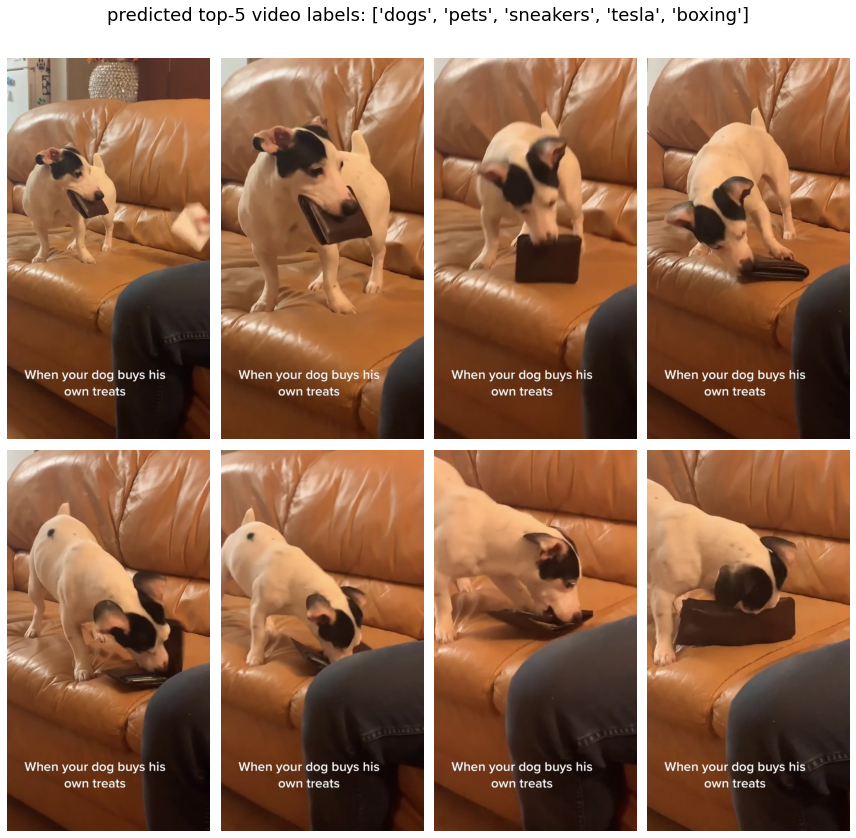

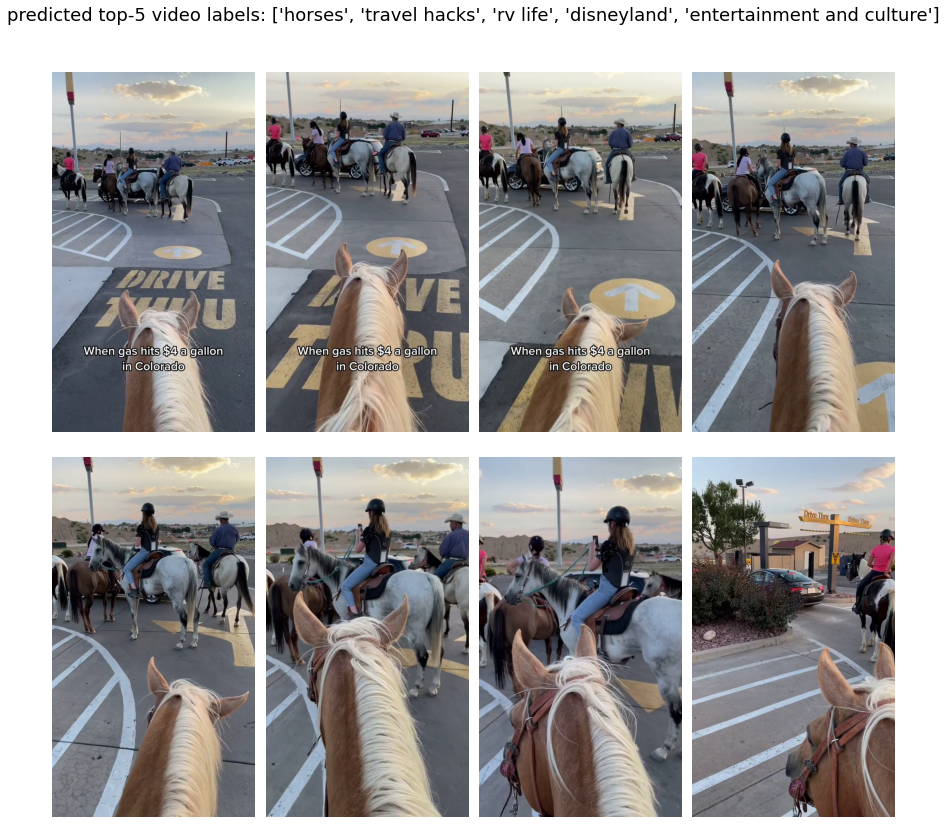

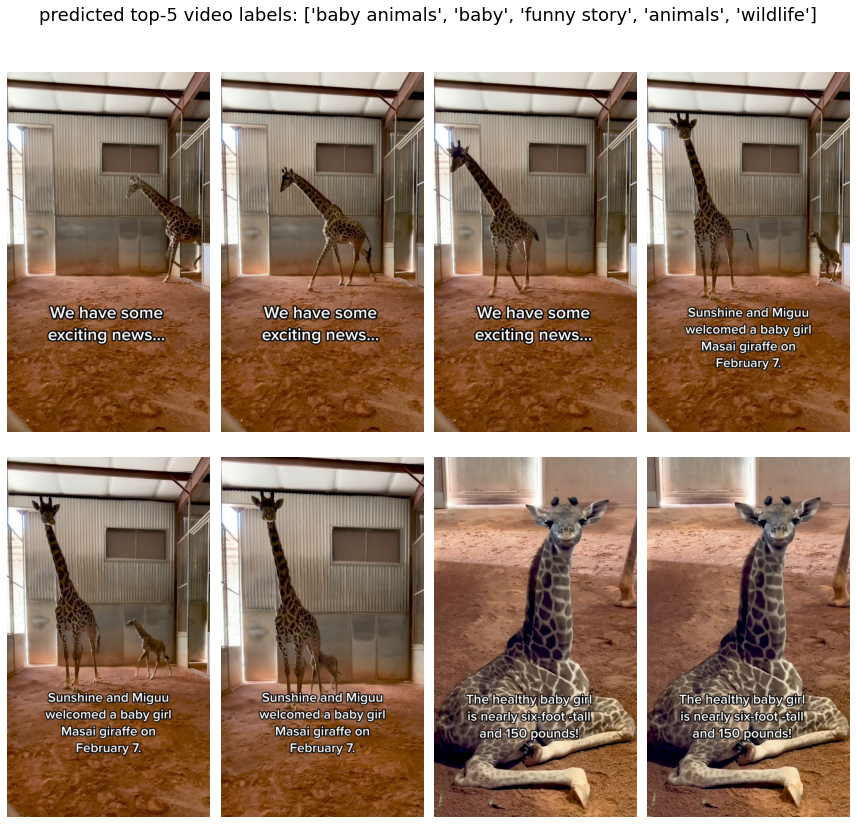

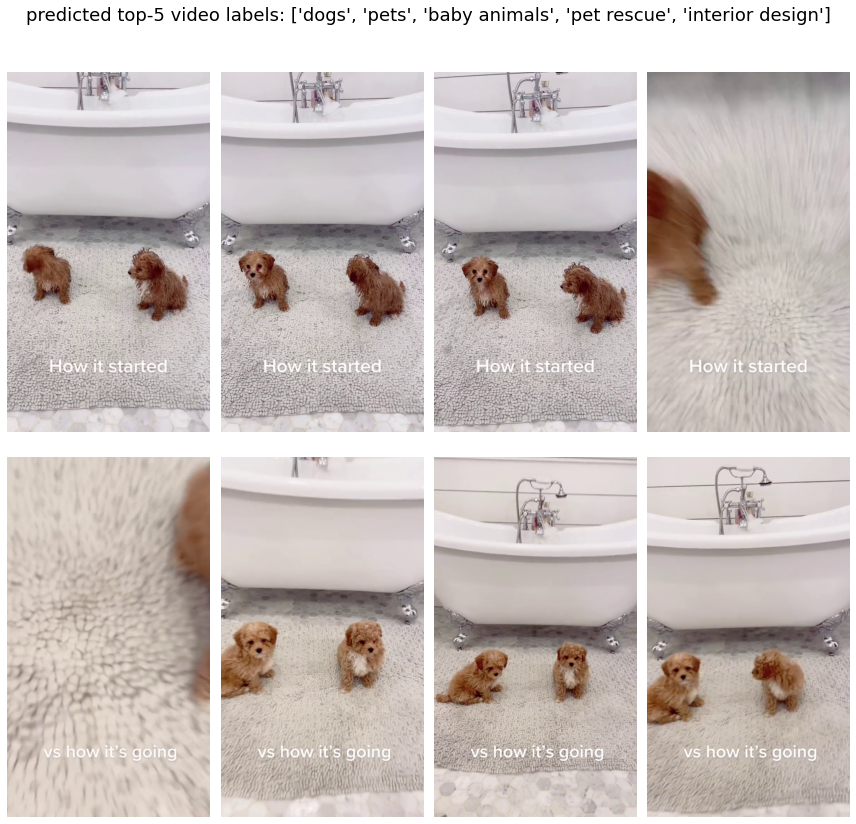

In [57]:
import os
folder = '/home/dongguo/Downloads/animal'
vset = os.listdir(folder)
for i in range(min(4, len(vset))):
    video_path = os.path.join(folder, vset[i])
    preds1, preds2 = run_experiment(video_path)

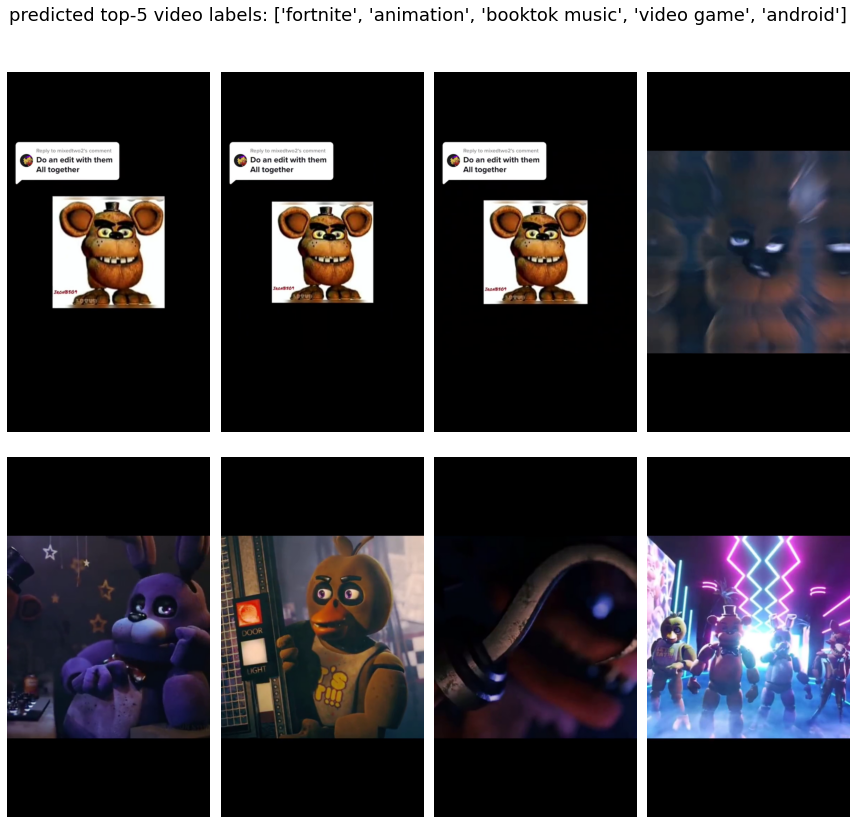

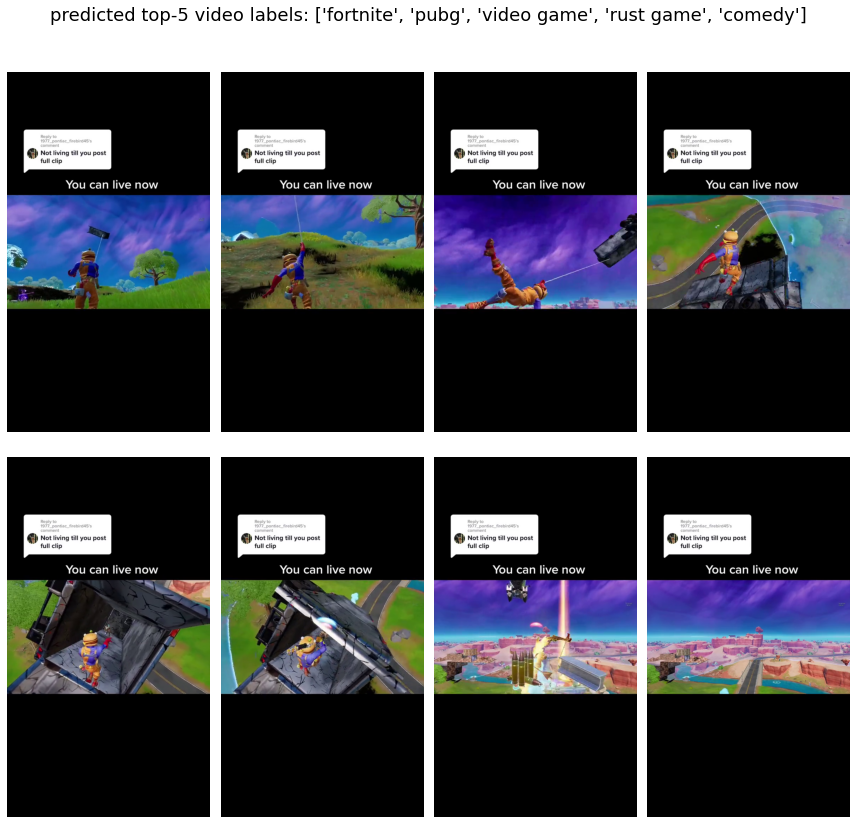

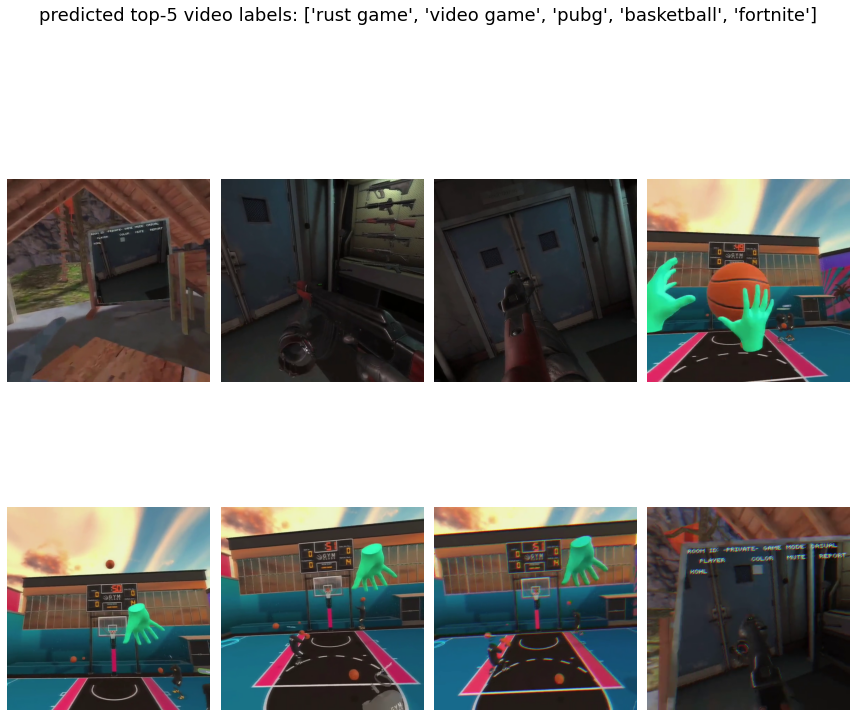

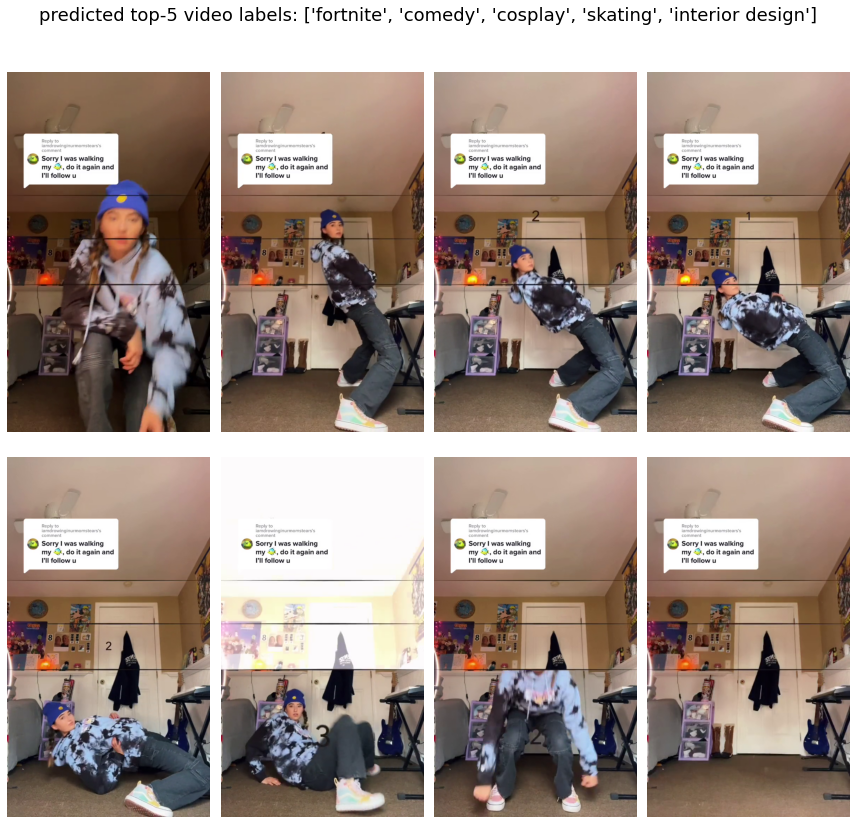

In [58]:
import os
folder = '/home/dongguo/Downloads/gaming'
vset = os.listdir(folder)
for i in range(min(4, len(vset))):
    video_path = os.path.join(folder, vset[i])
    preds1, preds2 = run_experiment(video_path)

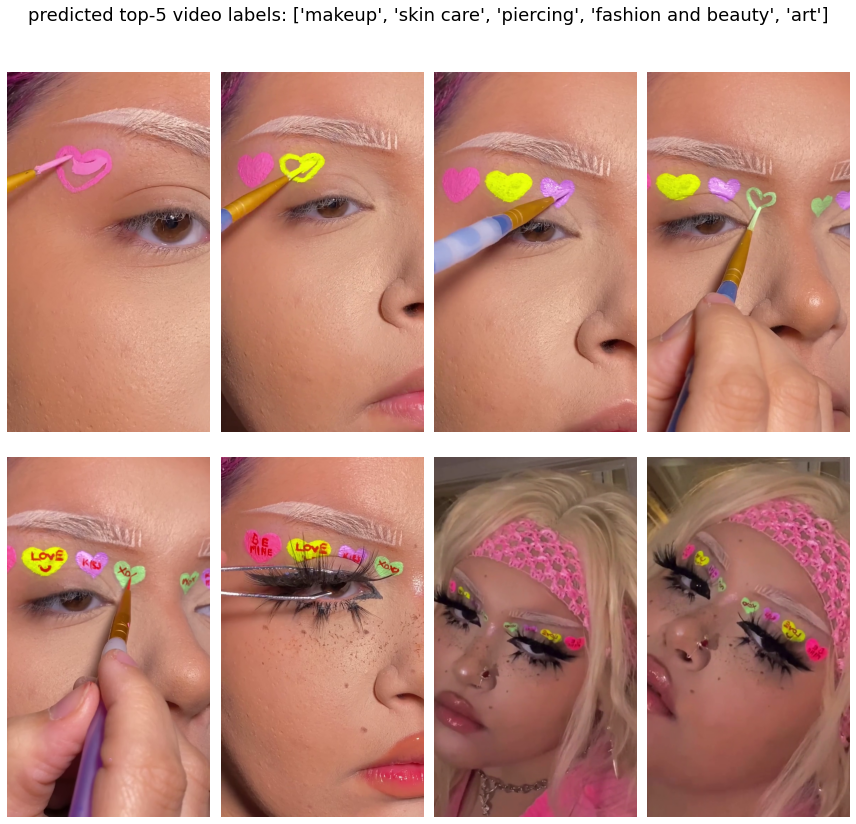

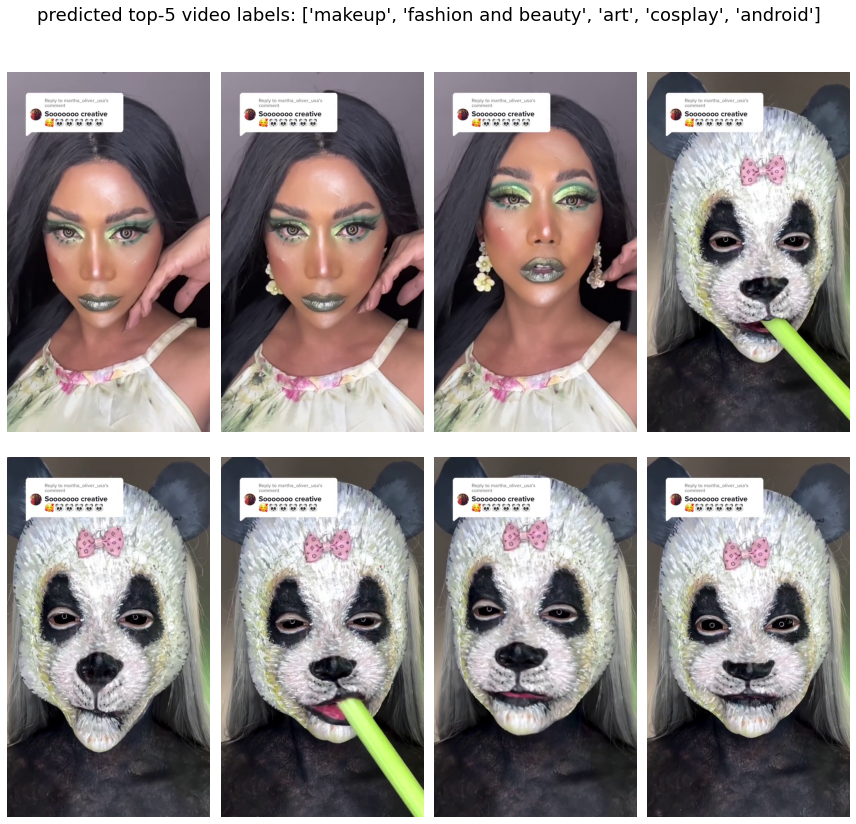

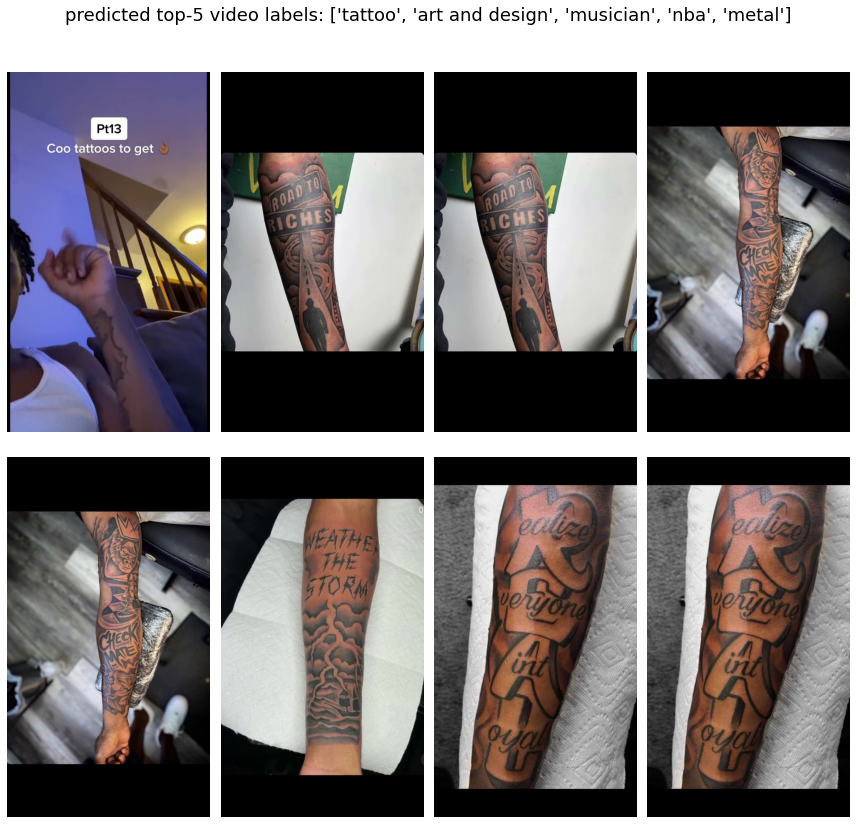

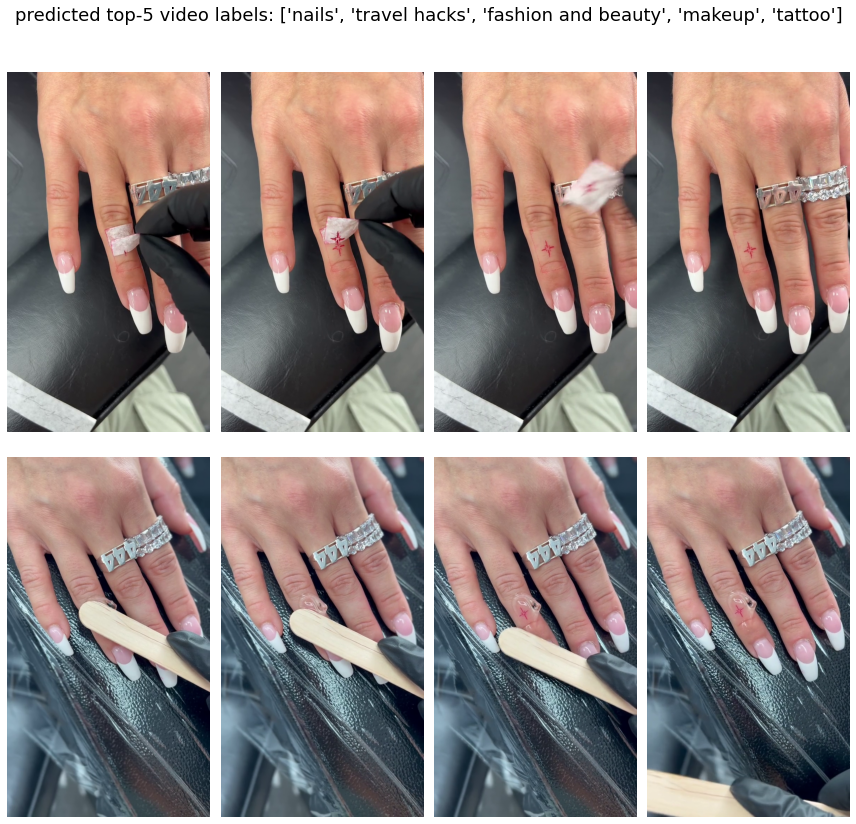

In [59]:
import os
folder = '/home/dongguo/Downloads/beauty'
vset = os.listdir(folder)
for i in range(min(4, len(vset))):
    video_path = os.path.join(folder, vset[i])
    preds1, preds2 = run_experiment(video_path)